### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [5]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

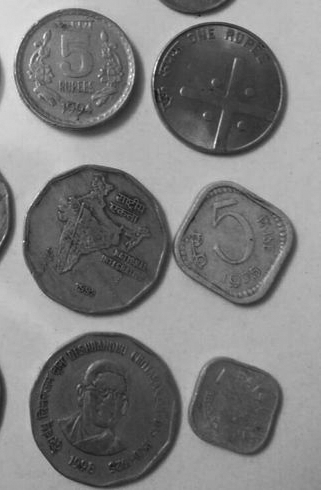

In [8]:
# 1A
monety_szare = cv2.imread('dane1-4/Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

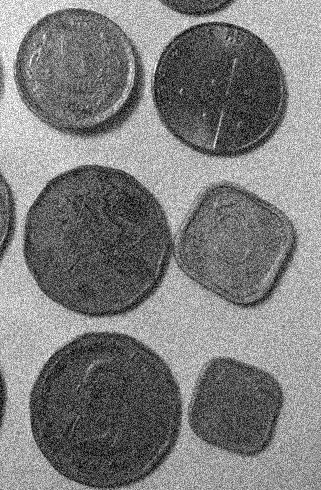

In [9]:
# 1B
monety_szare_szum = cv2.imread('dane1-4/Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

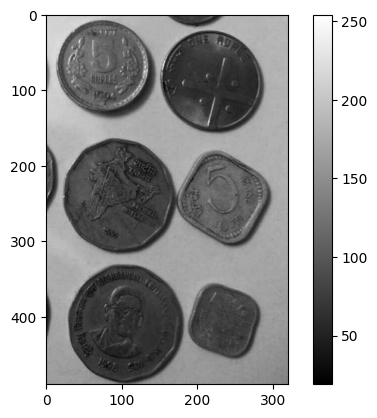

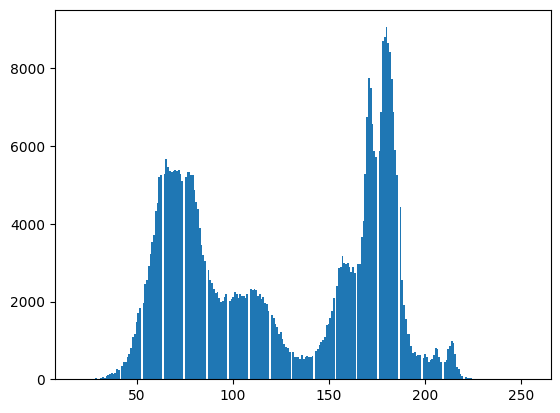

In [17]:
monety_szare_test = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)

plt.imshow(monety_szare_test, cmap='gray')
plt.colorbar()
plt.show()
plt.hist(monety_szare.flatten(), bins=256)
plt.show()

treshold:  127.0


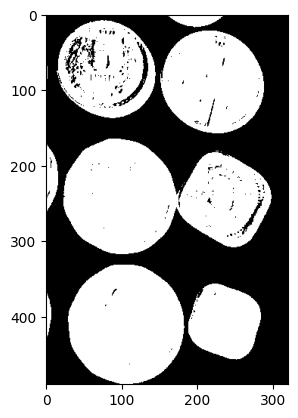

In [38]:
# otsu thresholding
T, monety_otsu = cv2.threshold(monety_szare_test, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)



print("treshold: ", T)
plt.imshow(monety_otsu, cmap='gray')

Rozwiązanie części 1B:


Text(0.5, 1.0, 'Otsu thresholding')

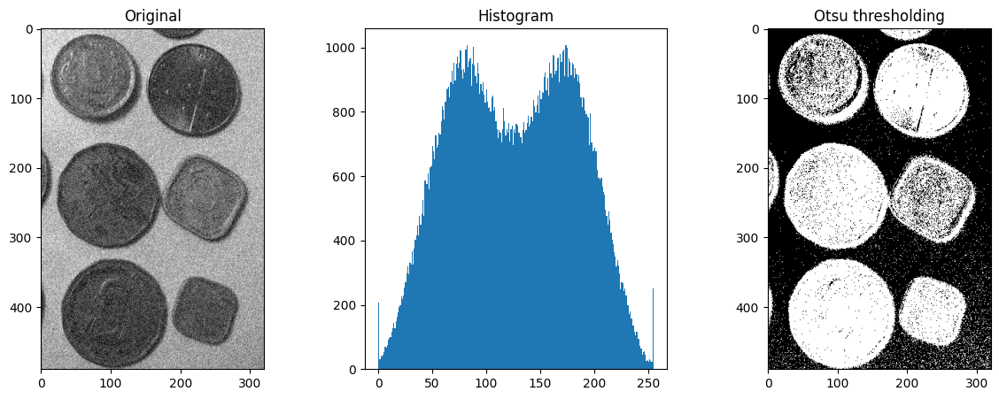

In [76]:
monety_szare_szum_test = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(monety_szare_szum_test, cmap='gray')
axs[0].set_title('Original')

axs[1].hist(monety_szare_szum_test.flatten(), bins=256)
axs[1].set_title('Histogram')

T, monety_otsu_szum = cv2.threshold(monety_szare_szum_test, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
axs[2].imshow(monety_otsu_szum, cmap='gray')
axs[2].set_title('Otsu thresholding')

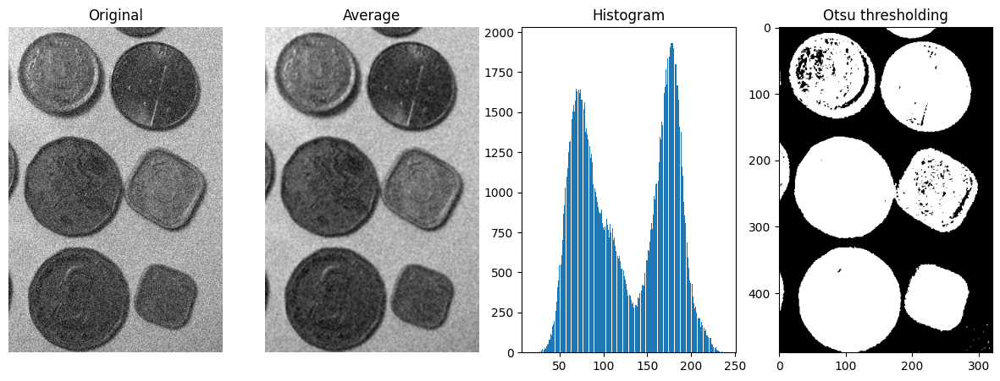

In [162]:
average_kernels = [
    np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]]) / 9,
    # np.array([[1, 1, 1], [1, 2, 1], [1, 1, 1]]) / 10,
    # np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]]) / 16,
    # np.array([[1, 1, 1], [1, 4, 1], [1, 1, 1]]) / 10
    # similar efects in all cases
]

for kernel in average_kernels:
    monety_szare_szum_2 = cv2.filter2D(monety_szare_szum_test, -1, kernel)
    fig, ax = plt.subplots(1, 4, figsize=(15, 5))

    ax[0].imshow(monety_szare_szum_test, cmap='gray')
    ax[0].set_title('Original')
    ax[0].axis('off')

    ax[1].imshow(monety_szare_szum_2, cmap='gray')
    ax[1].set_title('Average')
    ax[1].axis('off')

    ax[2].hist(monety_szare_szum_2.flatten(), bins=256)
    ax[2].set_title('Histogram')

    T, monety_szare_szum_treshold = cv2.threshold(monety_szare_szum_2, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    ax[3].imshow(monety_szare_szum_treshold, cmap='gray')
    ax[3].set_title('Otsu thresholding')

    plt.show()

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

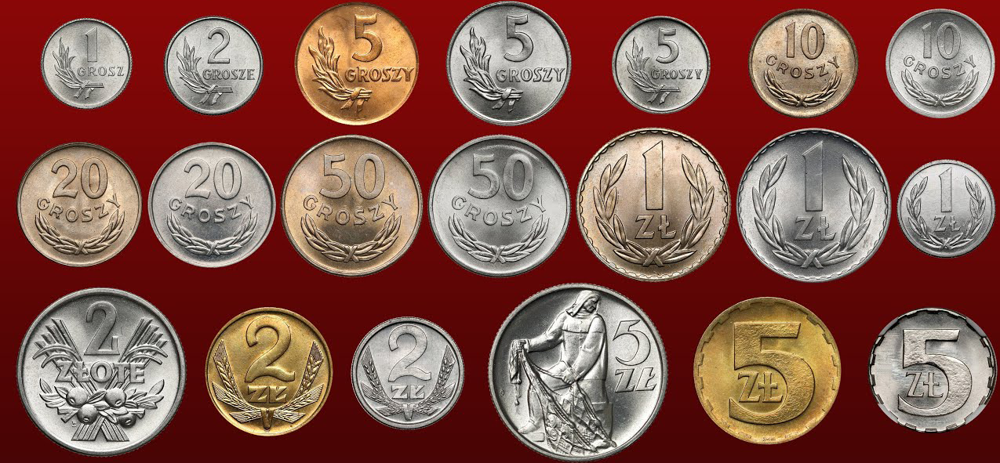

In [163]:
# 2A
monety_kolor = cv2.imread('dane1-4/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

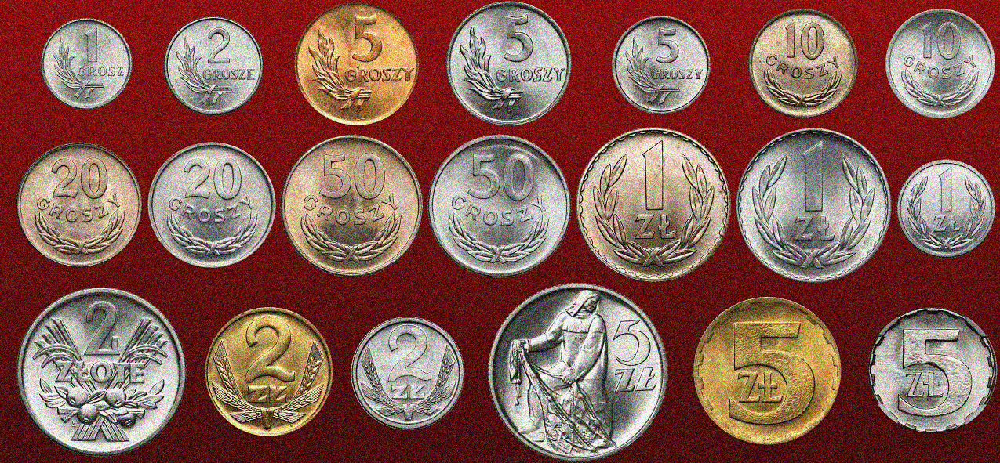

In [164]:
# 2B
monety_kolor_szum = cv2.imread('dane1-4/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

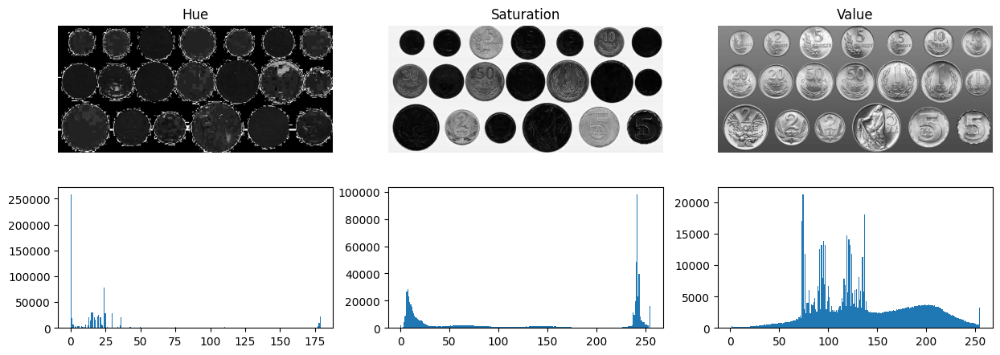

In [165]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)

h, s, v = cv2.split(monety_kolor_hsv)

fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, channel in enumerate([h, s, v]):
    axs[0, i].imshow(channel, cmap='gray')
    axs[0, i].set_title(['Hue', 'Saturation', 'Value'][i])
    axs[0, i].axis('off')

    axs[1, i].hist(channel.flatten(), bins=256)


Using hue

Text(0.5, 1.0, 'Original')

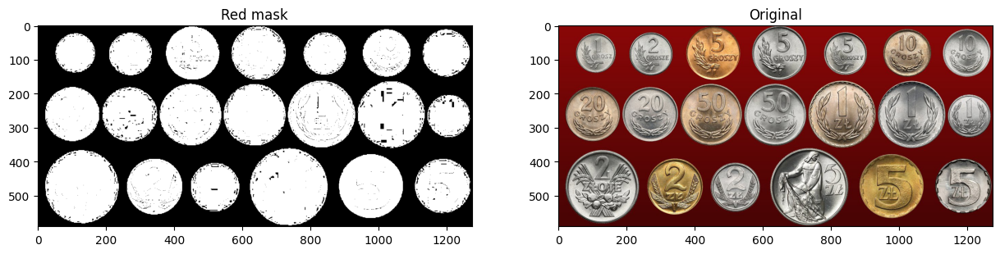

In [169]:
# threshold vi hue
# red_mask = cv2.bitwise_or(cv2.inRange(h, 0, 10), cv2.inRange(h, 170, 180))
red_mask = cv2.inRange(h, 10, 170)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(red_mask, cmap='gray')
axs[0].set_title('Red mask')

axs[1].imshow(monety_kolor[..., ::-1])
axs[1].set_title('Original')

Using Saturation

Otsu threshold:  131.0


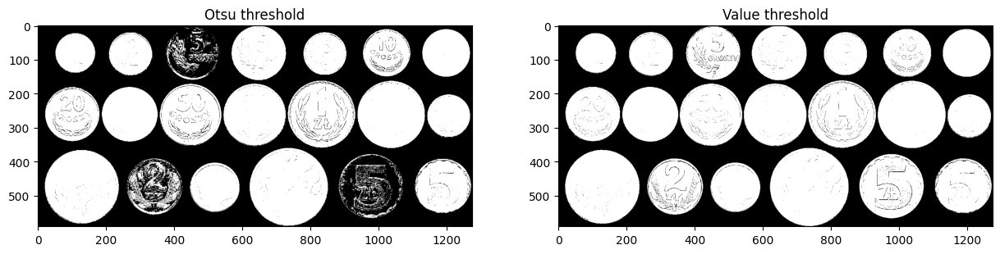

In [170]:
T, monety_kolor_treshold_otsu = cv2.threshold(s, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print("Otsu threshold: ", T)

_, monety_kolor_treshold = cv2.threshold(s, 200, 255, cv2.THRESH_BINARY_INV)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_treshold_otsu, cmap='gray')
axs[0].set_title('Otsu threshold')

axs[1].imshow(monety_kolor_treshold, cmap='gray')
axs[1].set_title('Value threshold')

plt.show()

Text(0.5, 1.0, 'Original')

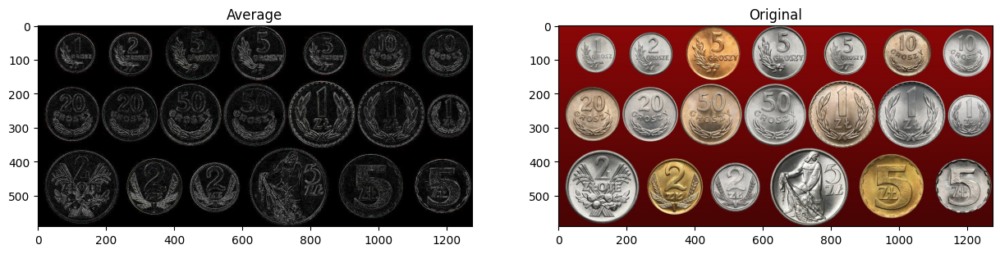

In [171]:
# kernel for edge
kernel = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])

monety_kolor_kernel = cv2.filter2D(monety_kolor, -1, kernel)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_kernel[..., ::-1])
axs[0].set_title('Average')

axs[1].imshow(monety_kolor[..., ::-1])
axs[1].set_title('Original')


Rozwiązanie części 2B:


Text(0.5, 1.0, 'Average')

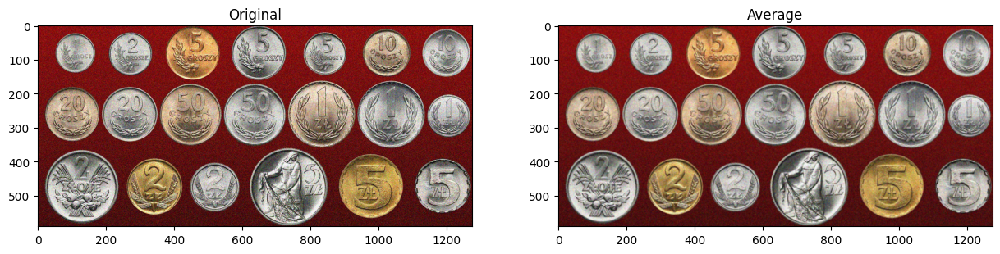

In [188]:
average_kernel = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]])
average_kernel = average_kernel / np.sum(average_kernel)

monety_kolor_avg = cv2.filter2D(monety_kolor_szum, -1, average_kernel)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_szum[..., ::-1])
axs[0].set_title('Original')

axs[1].imshow(monety_kolor_avg[..., ::-1])
axs[1].set_title('Average')


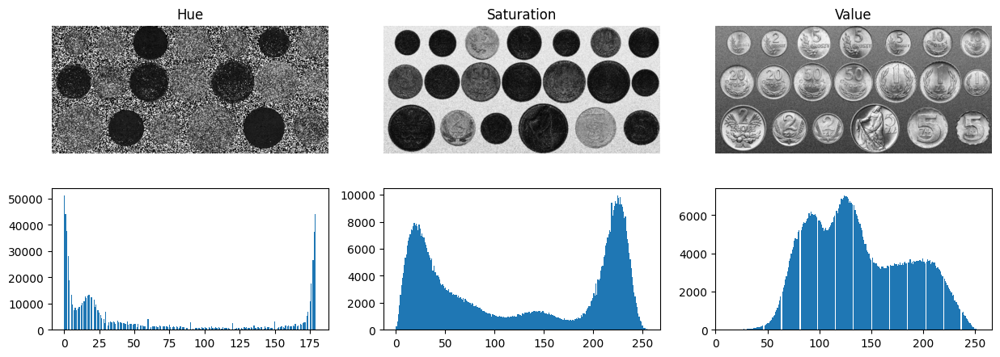

In [189]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor_avg, cv2.COLOR_BGR2HSV)

h, s, v = cv2.split(monety_kolor_hsv)

fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, channel in enumerate([h, s, v]):
    axs[0, i].imshow(channel, cmap='gray')
    axs[0, i].set_title(['Hue', 'Saturation', 'Value'][i])
    axs[0, i].axis('off')

    axs[1, i].hist(channel.flatten(), bins=256)

Text(0.5, 1.0, 'Original')

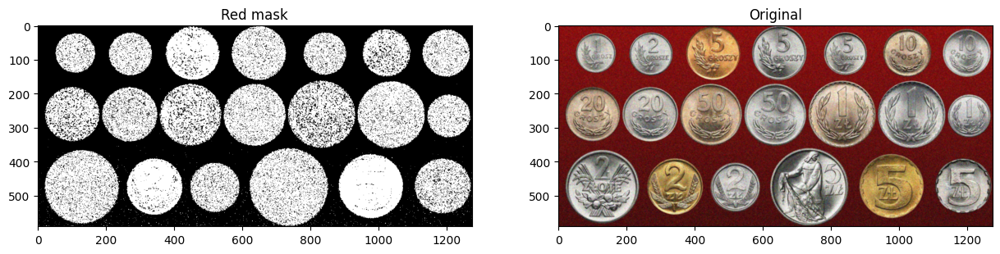

In [190]:
# by hue
red_mask = cv2.inRange(h, 10, 170)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(red_mask, cmap='gray')
axs[0].set_title('Red mask')

axs[1].imshow(monety_kolor_avg[..., ::-1])
axs[1].set_title('Original')

Otsu threshold:  126.0


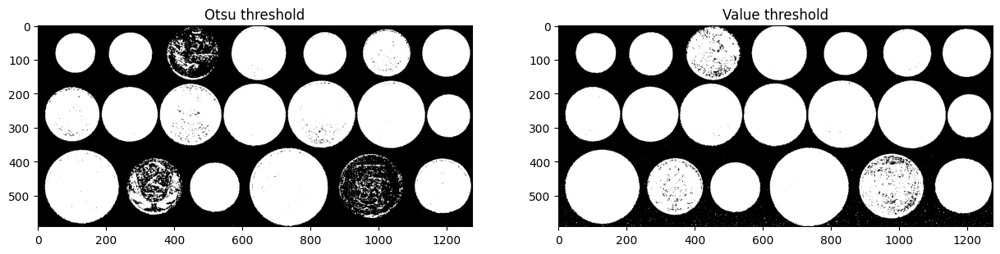

In [191]:
# by saturation
T, monety_kolor_treshold_otsu = cv2.threshold(s, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print("Otsu threshold: ", T)

_, monety_kolor_treshold = cv2.threshold(s, 170, 255, cv2.THRESH_BINARY_INV)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(monety_kolor_treshold_otsu, cmap='gray')
axs[0].set_title('Otsu threshold')

axs[1].imshow(monety_kolor_treshold, cmap='gray')
axs[1].set_title('Value threshold')

plt.show()


##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

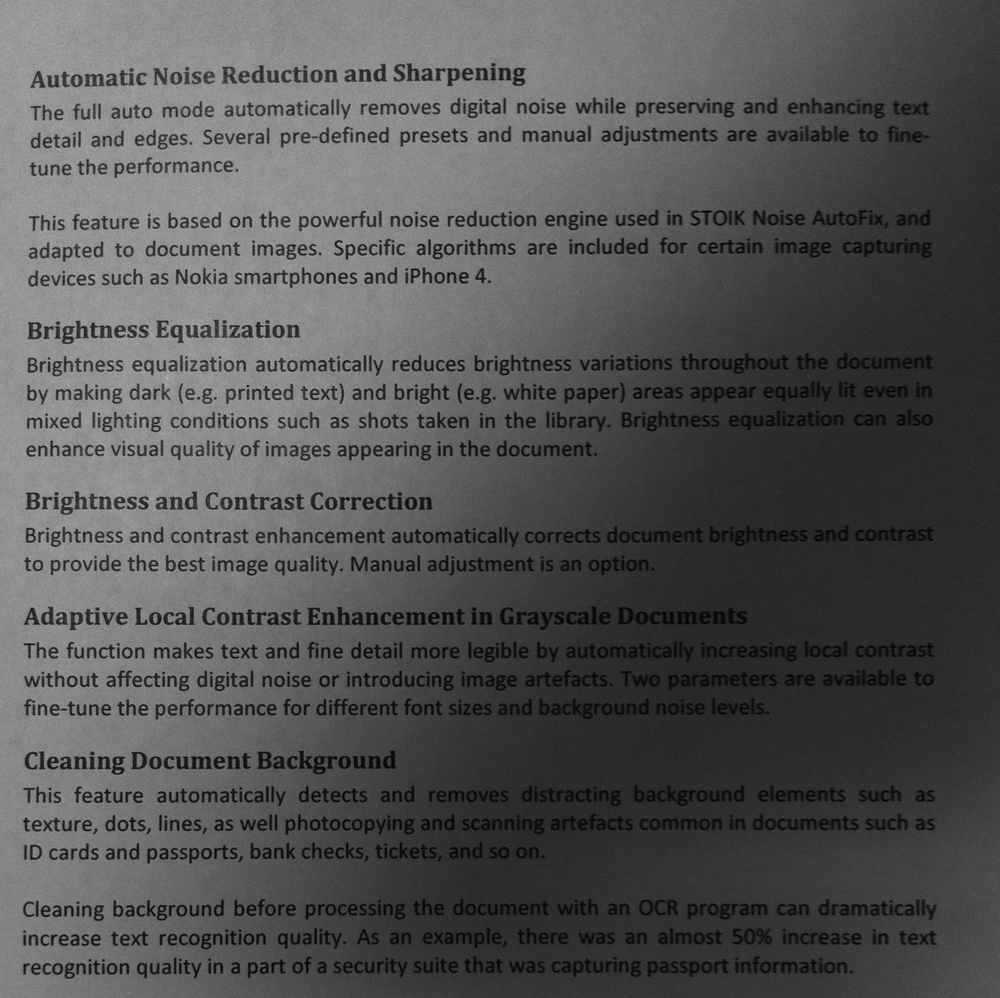

In [193]:
tekst = cv2.imread('dane1-4/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

treshold:  89.0


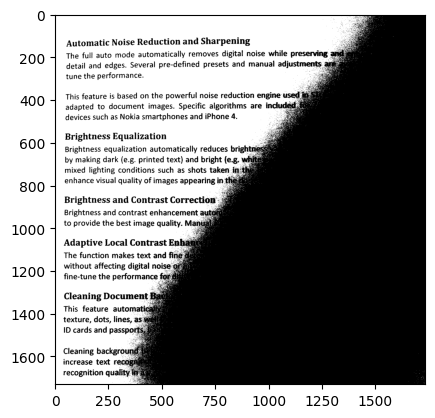

In [335]:
tekst_gray = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

T, tekst_treshold = cv2.threshold(tekst_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

print("treshold: ", T)
plt.imshow(tekst_treshold, cmap='gray')

In [319]:
tekst.shape

(1731, 1734, 3)

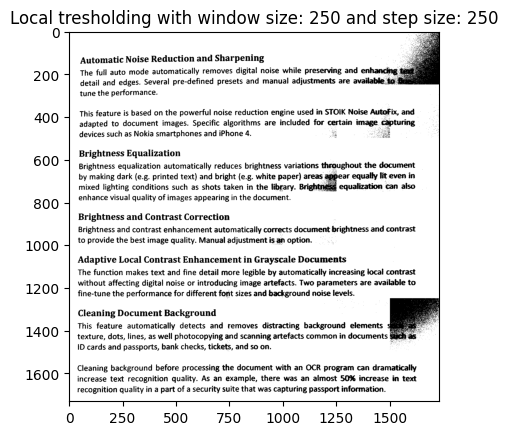

In [329]:
def treshold_local(img, window=50, step=25):
    result = np.zeros_like(img, dtype=np.float64)
    weight_sum = np.zeros_like(img, dtype=np.float64)

    for height_local in range(0, img.shape[0], step):
        for width_local in range(0, img.shape[1], step):
            img_local = img[height_local:height_local + window, width_local:width_local + window]
            T, img_treshold = cv2.threshold(img_local, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            weight = np.ones_like(img_local, dtype=np.float64)

            result[height_local:height_local + window, width_local:width_local + window] += img_treshold
            weight_sum[height_local:height_local + window, width_local:width_local + window] += weight

    result = result / weight_sum

    return result.astype(np.uint8)

window_size = 250
step_size = 250

tekst_treshold_local = treshold_local(tekst_gray, window=window_size, step=step_size)
plt.imshow(tekst_treshold_local, cmap='gray')
plt.title('Local tresholding with window size: {} and step size: {}'.format(window_size, step_size))
plt.show()

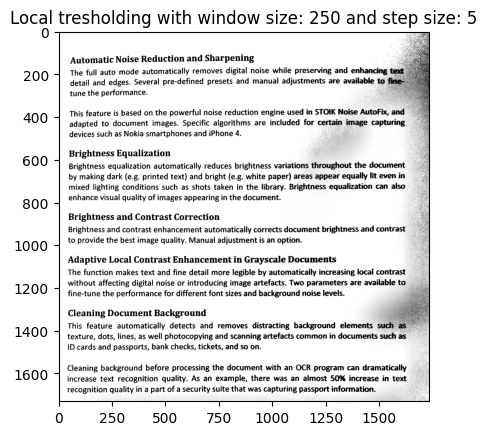

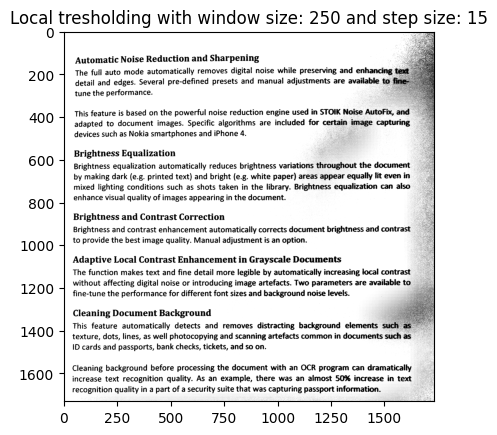

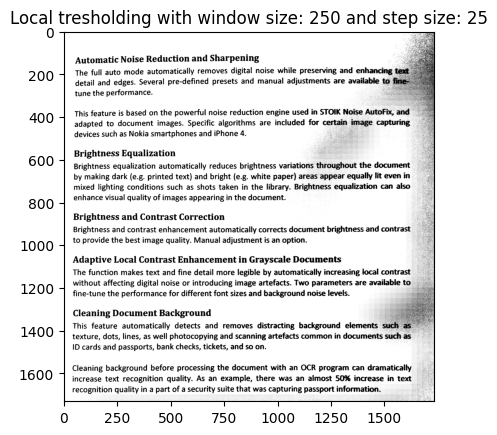

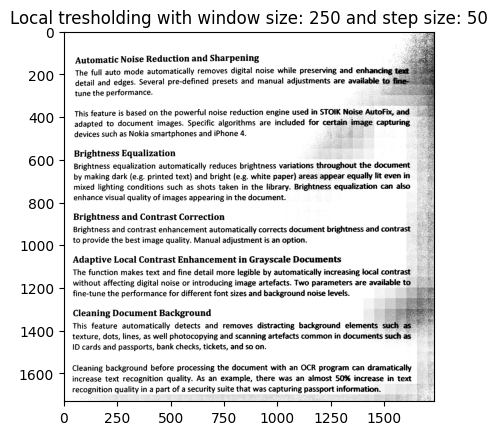

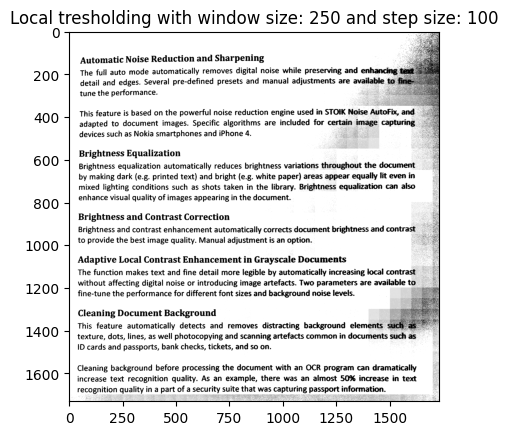

In [344]:
window_size = 250

step_sizes = [5, 15, 25, 50, 100]


for i, step_size in enumerate(step_sizes):
    tekst_treshold_local = treshold_local(tekst_gray, window=window_size, step=step_size)
    plt.imshow(tekst_treshold_local, cmap='gray')
    plt.title('Local tresholding with window size: {} and step size: {}'.format(window_size, step_size))
    plt.show()
    

Text(0.5, 1.0, 'Adaptive tresholding with window size: 501 and C: 2')

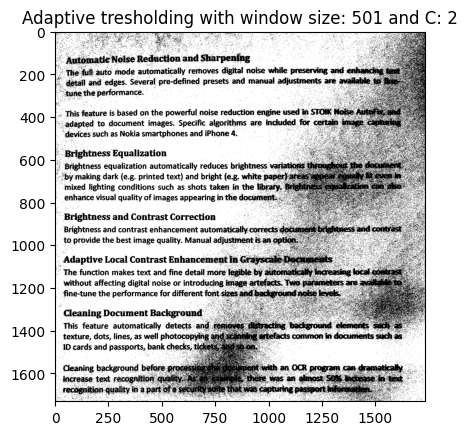

In [349]:
# USE adaptiveThreshold

window_size = 501
C = 2

tekst_treshold_adaptive = cv2.adaptiveThreshold(tekst_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, window_size, C)
plt.imshow(tekst_treshold_adaptive, cmap='gray')
plt.title('Adaptive tresholding with window size: {} and C: {}'.format(window_size, C))